In [3]:
import os
import random
import numpy as np
import cv2
from pathlib import Path
import shutil
from tqdm import tqdm
import matplotlib.pyplot as plt
from collections import Counter
import random
%matplotlib inline

## Splitting Source Images and Generating Composite Dataset  

- Splits images into train, validation, and test sets per class  
- Copies test images into a dedicated directory  
- Generates composite images at multiple grid sizes for training and validation  
- Creates a dataset configuration file for YOLO training  
- Provides visualization of sample composite images  


Class basophil: Total=1218, Train=926, Val=232, Test=60
Class eosinophil: Total=3117, Train=2369, Val=593, Test=155
Class erythroblast: Total=1551, Train=1179, Val=295, Test=77
Class immunoglobin: Total=2895, Train=2200, Val=551, Test=144
Class lymphocyte: Total=1214, Train=923, Val=231, Test=60
Class monocyte: Total=1420, Train=1079, Val=270, Test=71
Class neutrophil: Total=3329, Train=2530, Val=633, Test=166
Class platelet: Total=2348, Train=1784, Val=447, Test=117
Class lymphoblast: Total=870, Train=661, Val=166, Test=43
Copied test images and labels to composite_data/test
Generating composite images for the train split...
Generating composite images for the train split...
  1x1 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 975.65it/s]


  2x2 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 209.16it/s]


  3x3 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 101.09it/s]


  4x4 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 59.87it/s]


Composite image generation for train split complete.
Generating composite images for the val split...
Generating composite images for the val split...
  1x1 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 814.05it/s]


  2x2 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 211.45it/s]


  3x3 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 94.11it/s]


  4x4 grid, 5 samples


100%|██████████| 5/5 [00:00<00:00, 56.31it/s]


Composite image generation for val split complete.
Visualizing train samples...


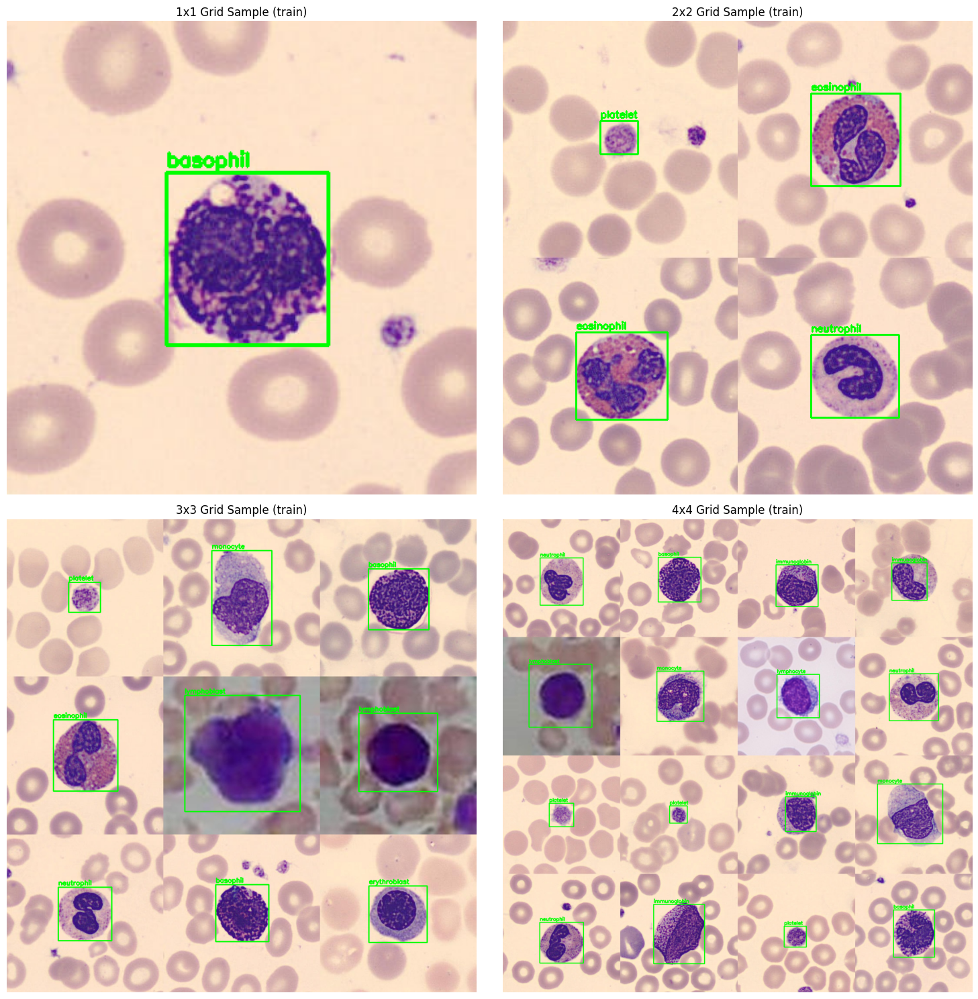

Visualizing val samples...


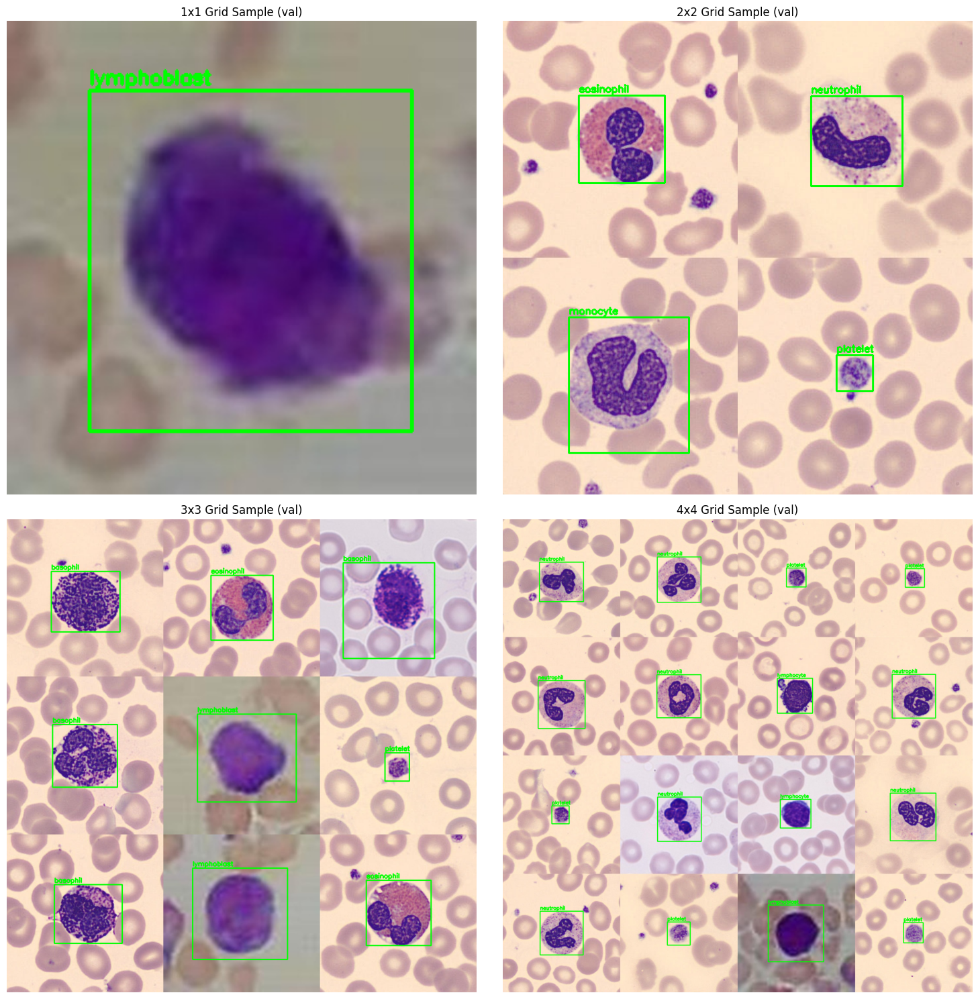

Created dataset.yaml at composite_data/dataset.yaml
Generating full dataset for train and val splits...
Generating composite images for the train split...
  1x1 grid, 1600 samples


100%|██████████| 1600/1600 [00:02<00:00, 722.64it/s]


  2x2 grid, 1600 samples


100%|██████████| 1600/1600 [00:07<00:00, 206.29it/s]


  3x3 grid, 1600 samples


100%|██████████| 1600/1600 [00:15<00:00, 104.71it/s]


  4x4 grid, 1600 samples


100%|██████████| 1600/1600 [00:26<00:00, 60.32it/s]


Composite image generation for train split complete.
Generating composite images for the val split...
  1x1 grid, 400 samples


100%|██████████| 400/400 [00:00<00:00, 709.99it/s]


  2x2 grid, 400 samples


100%|██████████| 400/400 [00:01<00:00, 216.69it/s]


  3x3 grid, 400 samples


100%|██████████| 400/400 [00:03<00:00, 111.32it/s]


  4x4 grid, 400 samples


100%|██████████| 400/400 [00:05<00:00, 68.99it/s]

Composite image generation for val split complete.
Created dataset.yaml at composite_data/dataset.yaml
Full dataset generation complete!


In [ ]:
# Define class names
class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
               'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Define directories
source_dir = Path("data")
output_dir = Path("composite_data")
os.makedirs(output_dir, exist_ok=True)

# Parameters for splitting source images (per class)
train_ratio = 0.8
test_ratio = 0.05  # ~5% for test; remaining (~15%) goes to validation

def split_source_images():
    """
    Split images in each class into train, val, and test.
    Returns a dictionary with keys 'train', 'val', 'test'.
    Each value is a dictionary mapping class names to a list of image file paths.
    """
    split_images = {"train": {}, "val": {}, "test": {}}
    
    for class_name in class_names:
        class_img_dir = source_dir / class_name / 'images'
        if not class_img_dir.exists():
            print(f"WARNING: Directory not found: {class_img_dir}")
            continue
        
        # Get list of images (jpg/png)
        imgs = list(class_img_dir.glob("*.jpg")) + list(class_img_dir.glob("*.png"))
        if not imgs:
            print(f"No images found for class {class_name}")
            continue

        random.shuffle(imgs)
        n_total = len(imgs)
        n_test = max(1, int(test_ratio * n_total))
        remaining = n_total - n_test
        n_train = int(train_ratio * remaining)
        n_val = remaining - n_train

        split_images["train"][class_name] = imgs[:n_train]
        split_images["val"][class_name] = imgs[n_train:n_train+n_val]
        split_images["test"][class_name] = imgs[n_train+n_val:]
        
        print(f"Class {class_name}: Total={n_total}, Train={len(split_images['train'][class_name])}, "
              f"Val={len(split_images['val'][class_name])}, Test={len(split_images['test'][class_name])}")
    
    return split_images

def generate_composite_dataset(split_images, split='train', samples_per_grid=50):
    """
    Generate composite images for a given split ('train' or 'val') using only the images from that split.
    Composite images for grid sizes 1x1, 2x2, 3x3, and 4x4 are created.
    """
    print(f"Generating composite images for the {split} split...")
    # Create output directories for the split
    split_out_dir = output_dir / split
    (split_out_dir / 'images').mkdir(parents=True, exist_ok=True)
    (split_out_dir / 'labels').mkdir(parents=True, exist_ok=True)

    img_size = (360, 363)  # Original image dimensions
    width, height = img_size
    
    # Generate composite images for each grid size
    for grid_size in [1, 2, 3, 4]:
        print(f"  {grid_size}x{grid_size} grid, {samples_per_grid} samples")
        for idx in tqdm(range(samples_per_grid)):
            # Create empty composite image
            composite_img = np.zeros((grid_size * height, grid_size * width, 3), dtype=np.uint8)
            composite_labels = []
            
            # Fill each cell in the grid
            for i in range(grid_size):
                for j in range(grid_size):
                    # Determine available classes that have images in the chosen split
                    available_classes = [c for c in class_names if c in split_images[split] and split_images[split][c]]
                    if not available_classes:
                        raise ValueError("No classes with available images found!")
                    
                    # Randomly choose a class and then an image from that class
                    class_name = random.choice(available_classes)
                    img_path = random.choice(split_images[split][class_name])
                    class_idx = class_names.index(class_name)
                    
                    # Read image and resize if needed
                    img = cv2.imread(str(img_path))
                    if img is None:
                        print(f"Warning: Could not read image {img_path}, using placeholder")
                        img = np.ones((height, width, 3), dtype=np.uint8) * 200  # Gray placeholder
                    else:
                        if img.shape[0] != height or img.shape[1] != width:
                            img = cv2.resize(img, (width, height))
                    
                    # Place image in composite grid
                    y_start = i * height
                    y_end = (i + 1) * height
                    x_start = j * width
                    x_end = (j + 1) * width
                    composite_img[y_start:y_end, x_start:x_end] = img
                    
                    # Adjust labels if they exist
                    label_path = source_dir / class_name / 'labels' / f"{img_path.stem}.txt"
                    if label_path.exists():
                        with open(label_path, 'r') as f:
                            for line in f:
                                parts = line.strip().split()
                                if len(parts) >= 5:
                                    x_center = float(parts[1])
                                    y_center = float(parts[2])
                                    width_norm = float(parts[3])
                                    height_norm = float(parts[4])
                                    # Adjust coordinates for composite image
                                    new_x_center = (x_center + j) / grid_size
                                    new_y_center = (y_center + i) / grid_size
                                    new_width = width_norm / grid_size
                                    new_height = height_norm / grid_size
                                    composite_labels.append((class_idx, new_x_center, new_y_center, new_width, new_height))
                    else:
                        # If no label, create one that covers almost the entire cell
                        new_x_center = (0.5 + j) / grid_size
                        new_y_center = (0.5 + i) / grid_size
                        new_width = 0.9 / grid_size
                        new_height = 0.9 / grid_size
                        composite_labels.append((class_idx, new_x_center, new_y_center, new_width, new_height))
            
            # Save composite image and labels, include grid size in filename
            img_filename = f"{grid_size}x{grid_size}_{idx:04d}.jpg"
            label_filename = f"{grid_size}x{grid_size}_{idx:04d}.txt"
            
            comp_img_path = split_out_dir / 'images' / img_filename
            comp_label_path = split_out_dir / 'labels' / label_filename
            
            cv2.imwrite(str(comp_img_path), composite_img)
            with open(comp_label_path, 'w') as f:
                for class_id, x, y, w, h in composite_labels:
                    f.write(f"{class_id} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")
    
    print(f"Composite image generation for {split} split complete.")

def visualize_samples(split='train'):
    """
    Visualize one composite sample per grid size from the given split.
    """
    split_out_dir = output_dir / split
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()
    
    for idx, grid_size in enumerate([1, 2, 3, 4]):
        # Find images in the split directory
        img_files = list((split_out_dir / 'images').glob(f"{grid_size}x{grid_size}_*.jpg"))
        if not img_files:
            axes[idx].text(0.5, 0.5, f"No {grid_size}x{grid_size} samples found", ha='center', va='center')
            axes[idx].axis('off')
            continue
        
        img_path = img_files[0]
        label_path = split_out_dir / 'labels' / f"{img_path.stem}.txt"
        
        img = cv2.imread(str(img_path))
        if img is None:
            axes[idx].text(0.5, 0.5, f"Failed to read {img_path.name}", ha='center', va='center')
            axes[idx].axis('off')
            continue
        
        h, w = img.shape[:2]
        if label_path.exists():
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1]) * w
                        y_center = float(parts[2]) * h
                        box_w = float(parts[3]) * w
                        box_h = float(parts[4]) * h
                        x1 = int(max(0, x_center - box_w / 2))
                        y1 = int(max(0, y_center - box_h / 2))
                        x2 = int(min(w-1, x_center + box_w / 2))
                        y2 = int(min(h-1, y_center + box_h / 2))
                        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                        cv2.putText(img, class_names[class_id] if class_id < len(class_names) else f"Class {class_id}",
                                    (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(f"{grid_size}x{grid_size} Grid Sample ({split})")
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

def create_dataset_yaml():
    """
    Create a dataset.yaml file for YOLO training pointing to the train and val composite images.
    """
    yaml_content = f"""path: {str(output_dir.absolute())}
train: {str((output_dir / 'train' / 'images').relative_to(output_dir))}
val: {str((output_dir / 'val' / 'images').relative_to(output_dir))}

names:
"""
    for idx, name in enumerate(class_names):
        yaml_content += f"  {idx}: {name}\n"
    
    with open(output_dir / 'dataset.yaml', 'w') as f:
        f.write(yaml_content)
    
    print(f"Created dataset.yaml at {output_dir / 'dataset.yaml'}")

def copy_test_images(split_images):
    """
    Copy test images (and corresponding labels, if they exist) into a dedicated test directory.
    """
    test_out_dir = output_dir / "test"
    (test_out_dir / 'images').mkdir(parents=True, exist_ok=True)
    (test_out_dir / 'labels').mkdir(parents=True, exist_ok=True)
    
    for class_name, img_paths in split_images["test"].items():
        for img_path in img_paths:
            # Copy the image
            shutil.copy(img_path, test_out_dir / 'images' / img_path.name)
            
            # Also copy the corresponding label if it exists
            label_path = source_dir / class_name / 'labels' / f"{img_path.stem}.txt"
            if label_path.exists():
                shutil.copy(label_path, test_out_dir / 'labels' / f"{img_path.stem}.txt")
    
    print(f"Copied test images and labels to {test_out_dir}")

def main():
    # Split the source images per class into train/val/test sets
    split_images = split_source_images()
    
    # Copy test images to a dedicated directory (composite_data/test)
    copy_test_images(split_images)
    
    # Generate composite images for train and val splits only
    print("Generating composite images for the train split...")
    generate_composite_dataset(split_images, split='train', samples_per_grid=5)
    
    print("Generating composite images for the val split...")
    generate_composite_dataset(split_images, split='val', samples_per_grid=5)
    
    # Visualize one sample per grid size from each split
    print("Visualizing train samples...")
    visualize_samples(split='train')
    print("Visualizing val samples...")
    visualize_samples(split='val')
    
    # Create dataset.yaml for YOLO training
    create_dataset_yaml()
    
    # Optionally, prompt the user before generating the full dataset
    response = input("Generate full dataset? (y/n): ")
    if response.lower() == 'y':
        print("Generating full dataset for train and val splits...")
        generate_composite_dataset(split_images, split='train', samples_per_grid=1600)
        generate_composite_dataset(split_images, split='val', samples_per_grid=400)
        create_dataset_yaml()
        print("Full dataset generation complete!")
    else:
        print("Full dataset generation skipped.")

if __name__ == "__main__":
    main()
else:
    print("Functions loaded. Use the following commands to generate the dataset:")
    print("1. split_images = split_source_images()")
    print("2. copy_test_images(split_images)")
    print("3. generate_composite_dataset(split_images, split='train', samples_per_grid=5)")
    print("4. visualize_samples(split='train')")


## Class Distribution Analysis  
 
- Computes class distribution for train and validation sets  
- Visualizes distributions as bar charts (counts and percentages)  
- Compares class distribution differences between train and validation sets  
- Provides insights into dataset balance for YOLO training  



TRAIN SET STATISTICS:
Total objects: 48041
Class distribution:
  basophil: 5299 (11.03%)
  eosinophil: 5297 (11.03%)
  erythroblast: 5422 (11.29%)
  immunoglobin: 5357 (11.15%)
  lymphocyte: 5364 (11.17%)
  monocyte: 5379 (11.20%)
  neutrophil: 5282 (10.99%)
  platelet: 5258 (10.94%)
  lymphoblast: 5383 (11.21%)

VAL SET STATISTICS:
Total objects: 12021
Class distribution:
  basophil: 1273 (10.59%)
  eosinophil: 1333 (11.09%)
  erythroblast: 1350 (11.23%)
  immunoglobin: 1312 (10.91%)
  lymphocyte: 1360 (11.31%)
  monocyte: 1368 (11.38%)
  neutrophil: 1360 (11.31%)
  platelet: 1308 (10.88%)
  lymphoblast: 1357 (11.29%)


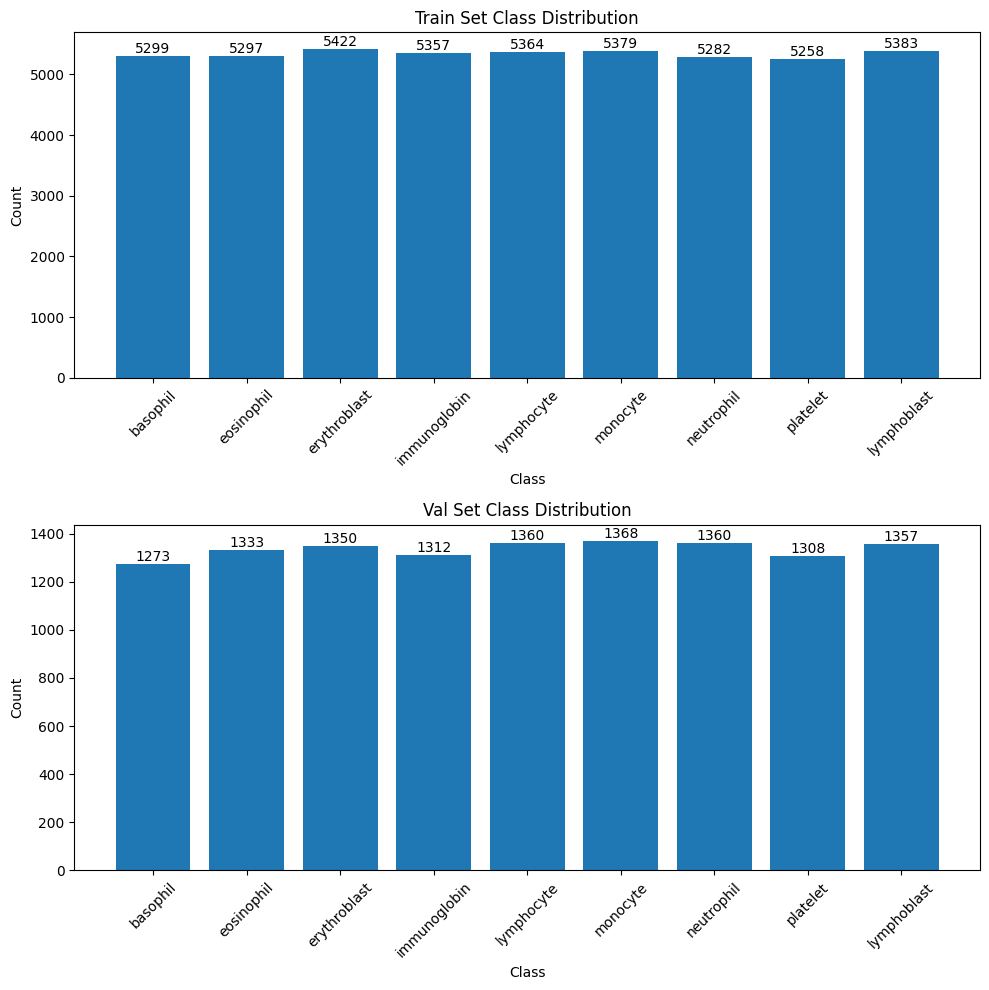

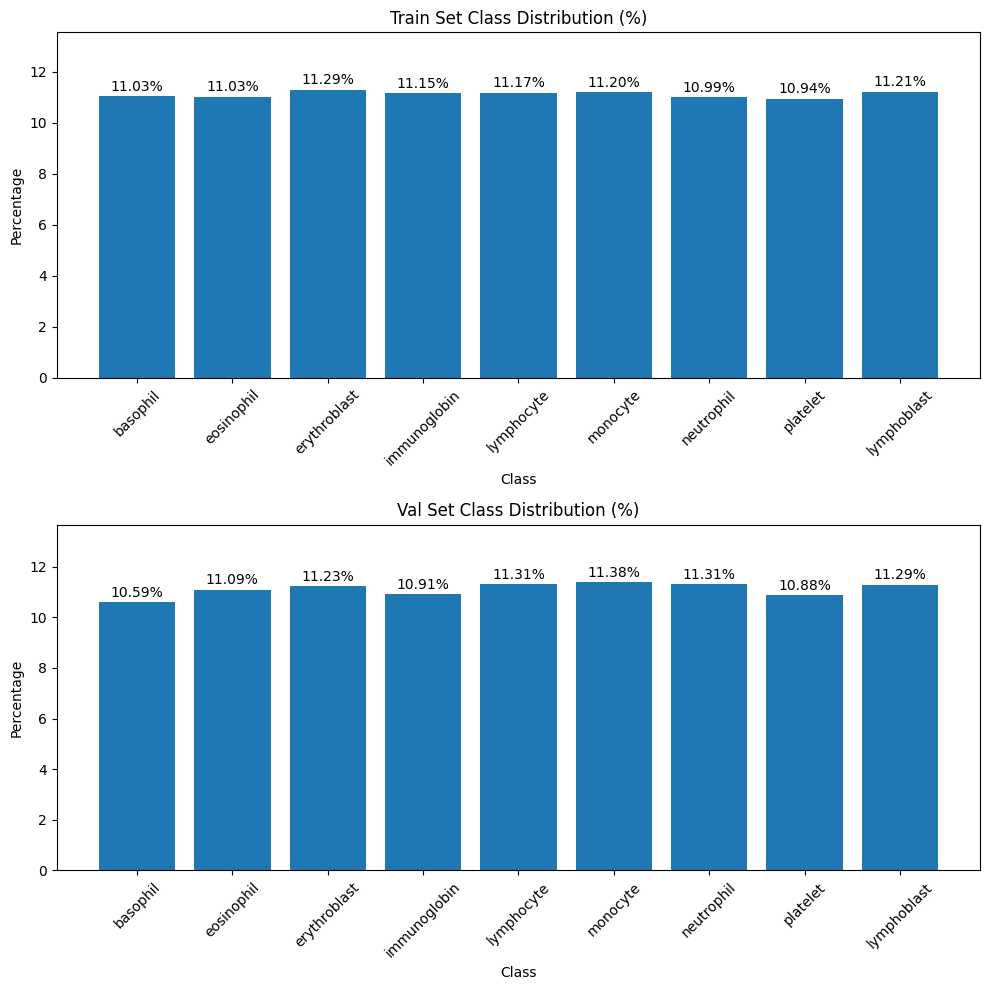


COMPARISON BETWEEN TRAIN AND VAL SETS:
  basophil: Train 11.03% vs Val 10.59% (Diff: 0.44%)
  eosinophil: Train 11.03% vs Val 11.09% (Diff: 0.06%)
  erythroblast: Train 11.29% vs Val 11.23% (Diff: 0.06%)
  immunoglobin: Train 11.15% vs Val 10.91% (Diff: 0.24%)
  lymphocyte: Train 11.17% vs Val 11.31% (Diff: 0.15%)
  monocyte: Train 11.20% vs Val 11.38% (Diff: 0.18%)
  neutrophil: Train 10.99% vs Val 11.31% (Diff: 0.32%)
  platelet: Train 10.94% vs Val 10.88% (Diff: 0.06%)
  lymphoblast: Train 11.21% vs Val 11.29% (Diff: 0.08%)


In [7]:
def calculate_class_distribution(dataset_dir='composite_data', 
                                 splits=['train', 'val'],
                                 class_names=None):
    """
    Calculate and visualize class distribution in YOLO dataset.
    
    Args:
        dataset_dir: Path to the dataset directory
        splits: List of dataset splits to analyze (e.g., ['train', 'val'])
        class_names: List of class names corresponding to class indices
    
    Returns:
        Dictionary with class distribution counts for each split
    """
    if class_names is None:
        # Use the class names from the code
        class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                      'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    dataset_path = Path(dataset_dir)
    results = {}
    
    for split in splits:
        # Path to the labels directory for this split
        labels_dir = dataset_path / split / 'labels'
        
        if not labels_dir.exists():
            print(f"Directory not found: {labels_dir}")
            continue
        
        # Counter to store class frequencies
        class_counter = Counter()
        
        # Counter for total objects
        total_objects = 0
        
        # Iterate through all label files
        for label_file in labels_dir.glob('*.txt'):
            with open(label_file, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        class_counter[class_id] += 1
                        total_objects += 1
        
        # Store results
        results[split] = {
            'counts': class_counter,
            'total': total_objects
        }
        
        # Print statistics
        print(f"\n{split.upper()} SET STATISTICS:")
        print(f"Total objects: {total_objects}")
        print("Class distribution:")
        
        # Sort by class ID
        for class_id in sorted(class_counter.keys()):
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})"
            count = class_counter[class_id]
            percentage = (count / total_objects) * 100 if total_objects > 0 else 0
            print(f"  {class_name}: {count} ({percentage:.2f}%)")
    
    # Visualize results
    visualize_distribution(results, class_names)
    
    return results

def visualize_distribution(results, class_names):
    """
    Visualize the class distribution as bar charts.
    
    Args:
        results: Dictionary with class distribution results
        class_names: List of class names
    """
    # Number of splits to visualize
    n_splits = len(results)
    
    # Create figure with subplots
    fig, axes = plt.subplots(n_splits, 1, figsize=(10, 5 * n_splits))
    if n_splits == 1:
        axes = [axes]
    
    for i, (split, data) in enumerate(results.items()):
        # Get class counts and order them
        class_ids = sorted(data['counts'].keys())
        counts = [data['counts'][class_id] for class_id in class_ids]
        
        # Get class names for the x-axis
        labels = [class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})" 
                 for class_id in class_ids]
        
        # Create bar chart
        bars = axes[i].bar(labels, counts)
        axes[i].set_title(f'{split.capitalize()} Set Class Distribution')
        axes[i].set_xlabel('Class')
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)
        
        # Add count labels on top of bars
        for bar in bars:
            height = bar.get_height()
            axes[i].text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{int(height)}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Create a percentage distribution plot
    fig, axes = plt.subplots(n_splits, 1, figsize=(10, 5 * n_splits))
    if n_splits == 1:
        axes = [axes]
    
    for i, (split, data) in enumerate(results.items()):
        # Get class counts and calculate percentages
        total = data['total']
        class_ids = sorted(data['counts'].keys())
        percentages = [data['counts'][class_id] / total * 100 if total > 0 else 0 
                      for class_id in class_ids]
        
        # Get class names for the x-axis
        labels = [class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})" 
                 for class_id in class_ids]
        
        # Create bar chart
        bars = axes[i].bar(labels, percentages)
        axes[i].set_title(f'{split.capitalize()} Set Class Distribution (%)')
        axes[i].set_xlabel('Class')
        axes[i].set_ylabel('Percentage')
        axes[i].set_ylim(0, max(percentages) * 1.2)  # Give some headroom
        axes[i].tick_params(axis='x', rotation=45)
        
        # Add percentage labels on top of bars
        for bar in bars:
            height = bar.get_height()
            axes[i].text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{height:.2f}%', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Specify the path to your dataset
    dataset_dir = "composite_data"
    
    # Define class names (these should match the ones in your dataset)
    class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                  'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    # Calculate distribution
    results = calculate_class_distribution(dataset_dir, ['train', 'val'], class_names)
    
    # Additional analysis - Compare distributions between train and val
    if 'train' in results and 'val' in results:
        print("\nCOMPARISON BETWEEN TRAIN AND VAL SETS:")
        
        train_counts = results['train']['counts']
        val_counts = results['val']['counts']
        
        all_classes = sorted(set(list(train_counts.keys()) + list(val_counts.keys())))
        
        for class_id in all_classes:
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})"
            train_count = train_counts.get(class_id, 0)
            val_count = val_counts.get(class_id, 0)
            
            train_total = results['train']['total']
            val_total = results['val']['total']
            
            train_pct = (train_count / train_total) * 100 if train_total > 0 else 0
            val_pct = (val_count / val_total) * 100 if val_total > 0 else 0
            
            pct_diff = abs(train_pct - val_pct)
            
            print(f"  {class_name}: Train {train_pct:.2f}% vs Val {val_pct:.2f}% (Diff: {pct_diff:.2f}%)")

## YOLO Label Visualization  
 
- Displays random images with YOLO-labeled bounding boxes   
- Provides a quick visual check of dataset annotations  


Visualizing random images from training set:


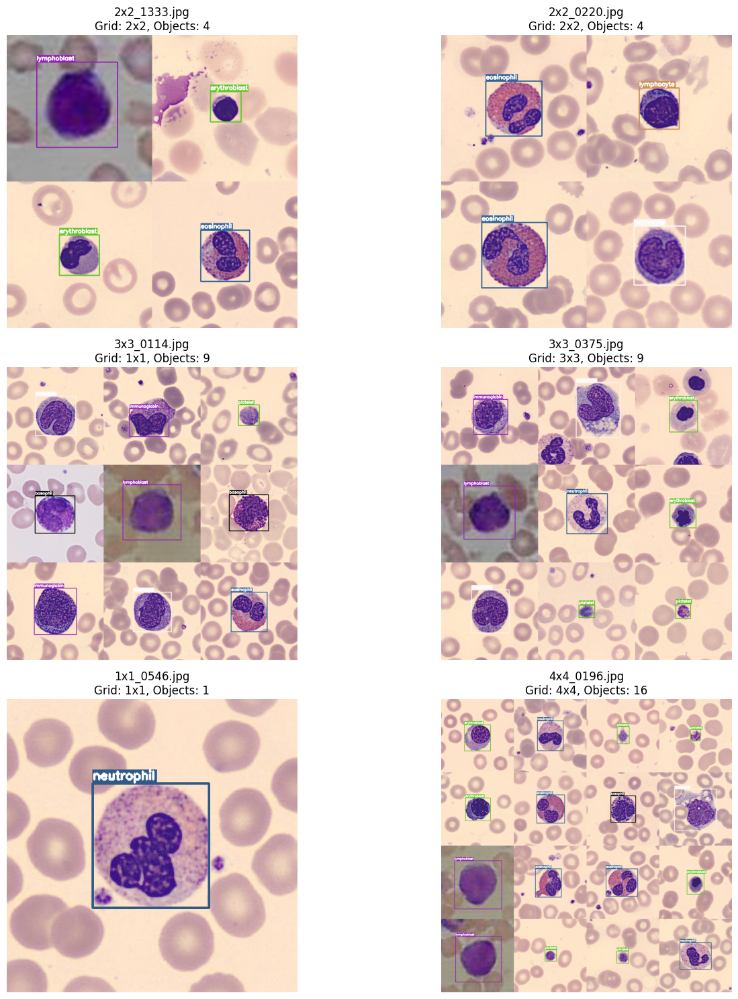


Visualizing random images from validation set:


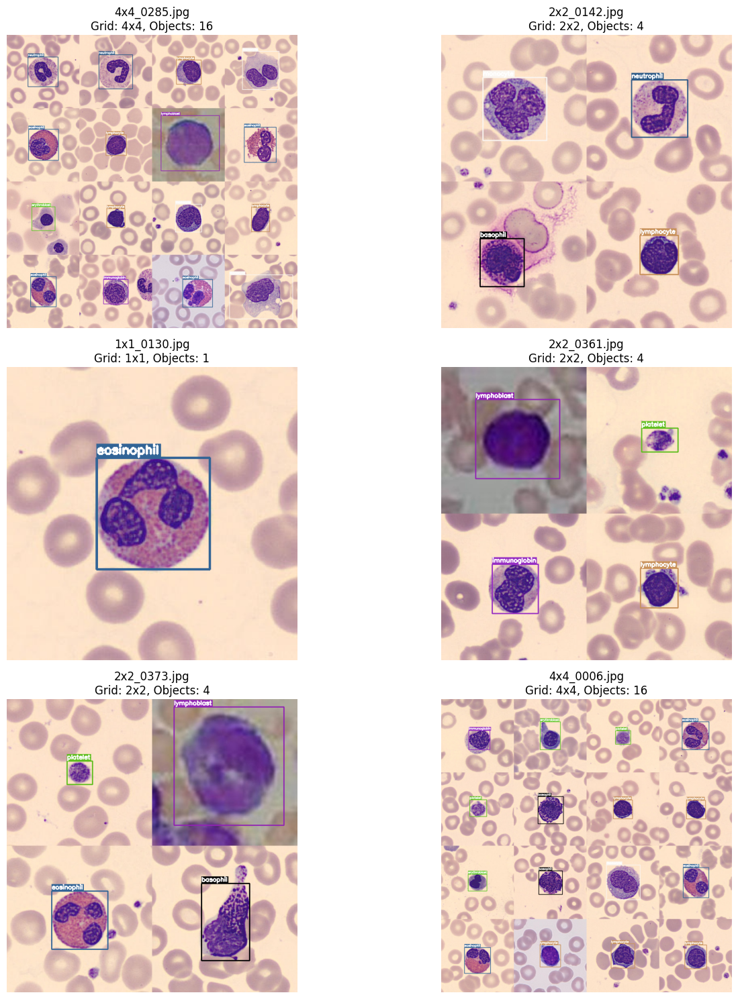


Visualizing examples from each grid size:

Visualizing random sample from 1x1 grid:


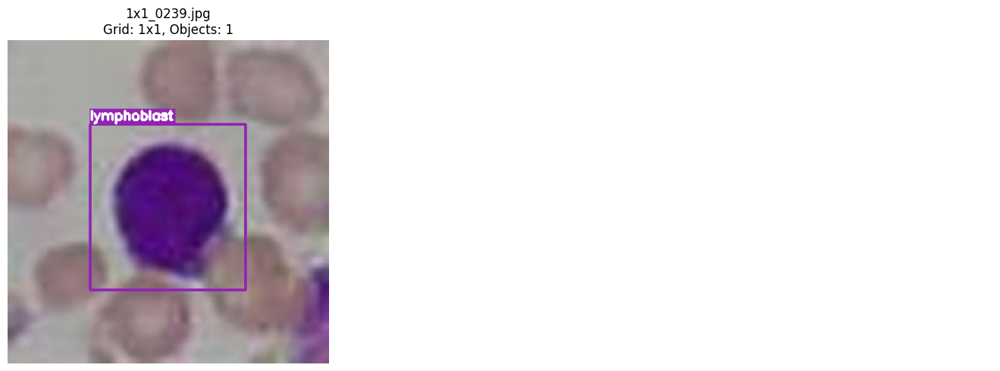


Visualizing random sample from 2x2 grid:


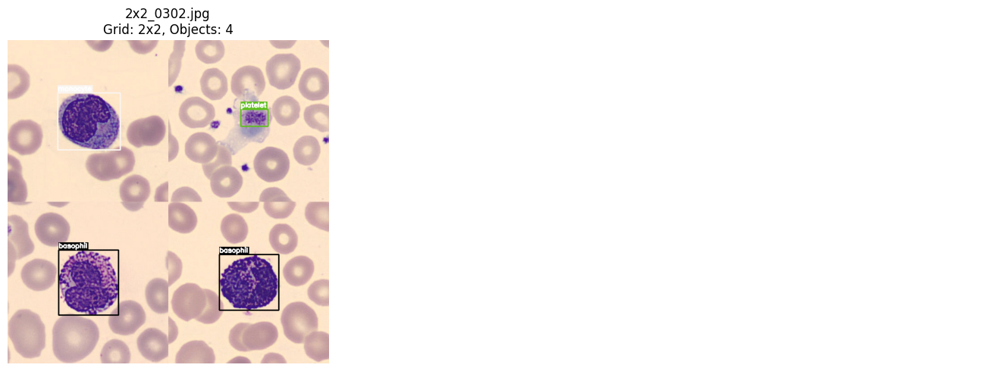


Visualizing random sample from 3x3 grid:


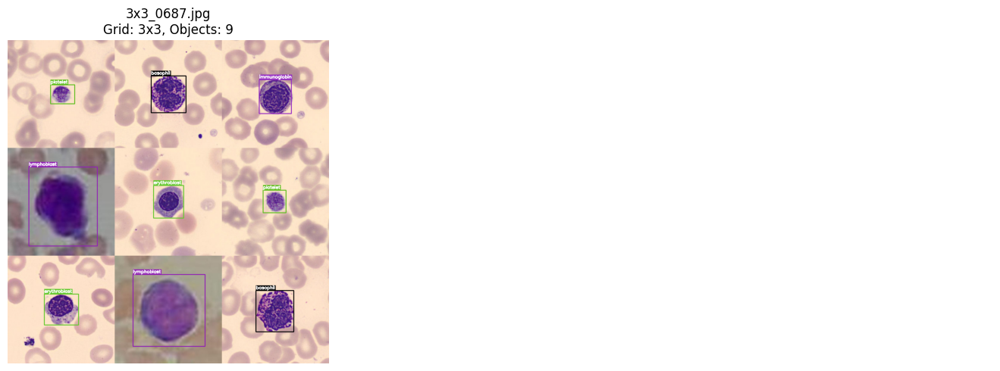


Visualizing random sample from 4x4 grid:


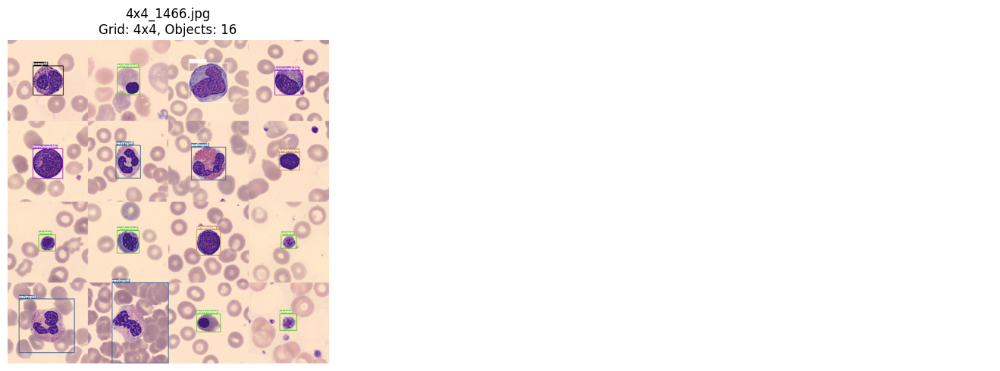

In [9]:
def visualize_random_yolo_labels(dataset_dir='composite_data', 
                                split='train', 
                                num_samples=4, 
                                class_names=None,
                                grid_sizes=None):
    """
    Visualize random images with their YOLO bounding boxes.
    
    Args:
        dataset_dir: Path to the dataset directory
        split: Dataset split to analyze ('train' or 'val')
        num_samples: Number of random samples to display
        class_names: List of class names corresponding to class indices
        grid_sizes: List of grid sizes to sample from (e.g., ['1x1', '2x2', '3x3', '4x4'])
    """
    if class_names is None:
        class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                      'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    # Default grid sizes if not specified
    if grid_sizes is None:
        grid_sizes = ['1x1', '2x2', '3x3', '4x4']
        
    dataset_path = Path(dataset_dir)
    
    # Path to images and labels
    split_path = dataset_path / split
    images_path = split_path / 'images'
    labels_path = split_path / 'labels'
    
    if not images_path.exists() or not labels_path.exists():
        print(f"Directory not found. Check if {split_path} exists and has images/labels folders.")
        return
    
    # Get all image paths
    all_images = list(images_path.glob('*.jpg')) + list(images_path.glob('*.png'))
    
    if not all_images:
        print(f"No images found in {images_path}")
        return
        
    # Filter by grid size if specified
    if grid_sizes:
        filtered_images = []
        for img_path in all_images:
            # Extract grid size from filename (e.g., "1x1_0001.jpg")
            for grid_size in grid_sizes:
                if img_path.name.startswith(f"{grid_size}_") or img_path.name.startswith(f"{grid_size.replace('x', '')}_"):
                    filtered_images.append(img_path)
                    break
        
        # Use filtered list if not empty, otherwise use all images
        selected_images = filtered_images if filtered_images else all_images
    else:
        selected_images = all_images
    
    # Sample random images
    if len(selected_images) < num_samples:
        samples = selected_images
        print(f"Warning: Only {len(samples)} images available, showing all of them.")
    else:
        samples = random.sample(selected_images, num_samples)
    
    # Setup plotting
    fig_width = 15
    fig_height = 5 * ((num_samples + 1) // 2)  # Adjust height based on number of samples
    fig, axes = plt.subplots(((num_samples + 1) // 2), 2, figsize=(fig_width, fig_height))
    
    # Convert to 1D array if only 1 sample
    if num_samples == 1:
        axes = np.array([axes])
    
    # Flatten axes for easy iteration
    axes = axes.flatten()
    
    # Display each sample
    for i, img_path in enumerate(samples):
        if i >= len(axes):
            break
            
        # Get corresponding label path
        label_path = labels_path / f"{img_path.stem}.txt"
        
        # Read image
        img = cv2.imread(str(img_path))
        if img is None:
            axes[i].text(0.5, 0.5, f"Failed to read {img_path.name}", 
                         ha='center', va='center', fontsize=12)
            axes[i].axis('off')
            continue
            
        # Convert from BGR to RGB for matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # Create a copy for drawing
        img_with_boxes = img_rgb.copy()
        
        # Read and draw labels if they exist
        if label_path.exists():
            with open(label_path, 'r') as f:
                lines = f.readlines()
                
            # Display how many objects are in this image
            num_objects = len(lines)
            
            # Draw each bounding box
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center = float(parts[1]) * w
                    y_center = float(parts[2]) * h
                    width = float(parts[3]) * w
                    height = float(parts[4]) * h
                    
                    # Calculate bounding box coordinates
                    x1 = int(max(0, x_center - width / 2))
                    y1 = int(max(0, y_center - height / 2))
                    x2 = int(min(w-1, x_center + width / 2))
                    y2 = int(min(h-1, y_center + height / 2))
                    
                    # Generate a random color based on class id
                    color = np.array([
                        (class_id * 50) % 255,  # R
                        (class_id * 100) % 255,  # G
                        (class_id * 150) % 255   # B
                    ], dtype=np.uint8)
                    color = tuple(map(int, color))
                    
                    # Draw rectangle
                    cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), color, 2)
                    
                    # Get class name
                    class_name = class_names[class_id] if class_id < len(class_names) else f"Class {class_id}"
                    
                    # Draw label background
                    text_size = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
                    cv2.rectangle(img_with_boxes, (x1, y1 - text_size[1] - 5), (x1 + text_size[0], y1), color, -1)
                    
                    # Draw class name
                    cv2.putText(img_with_boxes, class_name, (x1, y1 - 5),
                              cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
            
            # Display image with bounding boxes
            axes[i].imshow(img_with_boxes)
            
            # Extract grid size from filename
            grid_size = None
            for size in ['1x1', '2x2', '3x3', '4x4']:
                if size in img_path.name or size.replace('x', '') in img_path.name:
                    grid_size = size
                    break
                    
            # Set title with image information
            title = f"{img_path.name}\nGrid: {grid_size}, Objects: {num_objects}"
            axes[i].set_title(title)
        else:
            # No labels found
            axes[i].imshow(img_rgb)
            axes[i].set_title(f"{img_path.name}\nNo labels found")
        
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Function to visualize images from specific grid sizes
def visualize_grid_examples(dataset_dir='composite_data', 
                            split='train',
                            class_names=None):
    """
    Visualize one example from each grid size (1x1, 2x2, 3x3, 4x4).
    """
    # Use the main function with explicit grid sizes
    grid_sizes = ['1x1', '2x2', '3x3', '4x4']
    for grid_size in grid_sizes:
        print(f"\nVisualizing random sample from {grid_size} grid:")
        visualize_random_yolo_labels(dataset_dir, split, 1, class_names, [grid_size])

# Example usage
if __name__ == "__main__":
    # Define your class names
    class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                  'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    print("Visualizing random images from training set:")
    visualize_random_yolo_labels('composite_data', 'train', 6, class_names)
    
    print("\nVisualizing random images from validation set:")
    visualize_random_yolo_labels('composite_data', 'val', 6, class_names)
    
    print("\nVisualizing examples from each grid size:")
    visualize_grid_examples('composite_data', 'train', class_names)